# Desafio Cientista de Dados - Séries temporais

Este projeto tem por objetivo resolver um problema clássico de séries temporais com técnicas de Data Science, análise de dados e aplicação de modelos preditivos: prever o crescimento do PIB para cada país nos anos de 2024-2028, comparando com os dados previstos pelo Statistica, contidos no dataframe original.

A entrega é o código público em repositório que contenha:

a) README explicando como rodar o projeto

b) Arquivo requirements com todos os pacotes utilizados

c) Relatório de EDA em PDF, Jupyter Notebook ou semelhante, constando a descrição dos dados disponíveis, as principais estatísticas descritivas, as escolhas tomadas

d) Códigos de imputação dos valores "no data" e modelagem utilizados

e) Avaliação do modelo com justificativa para o uso das métricas escolhidas

f) Arquivo final predicted.csv com nenhum valor faltante e os resultados obtidos pelo modelo dos anos 2024-2028.

In [116]:
# Importações necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

### Os dados originais

O dataframe original foi fornecido em formado xls mas, para que pudesse ser importado para o Kedro com mais facilidade, transformamos em csv com o uso de sites de conversão gratuita.

Foi extraído do site https://www.imf.org/en/Publications/WEO/weo-database/2023/April/select-aggr-data, do Fundo Monetário Internacional (IMF), organização internacional que promove a cooperação e estabilidade mundial no que tange a aespectos monetários e comerciais, com vistas à redução da pobreza.

Ele conta com os seguintes dados: 
- Nas colunas, vemos os anos de 1980 a 2028
- Nas linhas, vemos o valor do PIB por país e grupos econômicos mundiais, referente a cada ano. São observados valores "no data", que serão tratados posteriormente

Abaixo, mostramos as 5 primeiras linhas do dataset

In [65]:
df = pd.read_csv('../data/01_raw/imf-dm-export-20230513.csv')
df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
2,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
3,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
4,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 50 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   Real GDP growth (Annual percent change)  229 non-null    object
 1   1980                                     228 non-null    object
 2   1981                                     228 non-null    object
 3   1982                                     228 non-null    object
 4   1983                                     228 non-null    object
 5   1984                                     228 non-null    object
 6   1985                                     228 non-null    object
 7   1986                                     228 non-null    object
 8   1987                                     228 non-null    object
 9   1988                                     228 non-null    object
 10  1989                                     228 non-null    objec

In [67]:
linhas_nulas = df[df.isnull().any(axis=1)]
display(linhas_nulas)

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
230,"©IMF, 2023",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
indices = linhas_nulas.index
df.drop(indices, inplace = True)
df.reset_index(drop = True, inplace = True)

As linhas nulas se referem a divisões do cabeçalho para o início dos dados e linhas após os dados, inclusive a logo da base de dados. Elas foram excluídas para que o dataframe tivesse somente os dados dos países.

Aplicando um filtro para observar as linhas com os valores "no data", verificamos que não existe padrão. Alguns valores se encontram nos primeiros anos, o que poderia ser explicado pela inexistência do cálculo do PIB para certos países, mas outros apresentam dados faltantes já nos últimos anos do conjunto de dados... 

Então, para viabilizar as análises, é necessário substituir esse valor por None, para que o código consiga processar os dados numéricos em plots.

In [69]:
mascara_no_data = df.applymap(lambda x: x == "no data").any(axis=1)
df_filtrado = df[mascara_no_data]
display(df_filtrado)

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
7,Armenia,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,7.6,-7.2,5.7,12.6,5.5,5,4.5,4.5,4.5,4.5
8,Aruba,no data,no data,no data,no data,no data,no data,no data,16.1,18.6,...,0.6,-18.6,17.2,5.7,1.6,1.2,1.2,1.1,1.1,1.1
11,Azerbaijan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2.5,-4.2,5.6,4.6,3,2.6,2.5,2.5,2.6,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,Africa (Region),no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3,-1.7,4.9,3.8,3.7,4.2,4.3,4.3,4.4,4.5
201,Central Asia and the Caucasus,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,1.9,0.6,9.6,5.3,3.1,3.9,3.3,3.1,3.2,3.2
212,Sub-Saharan Africa (Region),no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3,-1.7,4.6,3.6,3.5,4.1,4.1,4.1,4.3,4.3
220,Euro area,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,1.6,-6.1,5.4,3.5,0.8,1.4,1.9,1.7,1.5,1.4


In [70]:
df.replace('no data', None, inplace = True)
((df.isnull().sum())/len(df))* 100

Real GDP growth (Annual percent change)     0.000000
1980                                       25.877193
1981                                       24.122807
1982                                       23.684211
1983                                       23.684211
1984                                       23.684211
1985                                       23.684211
1986                                       23.245614
1987                                       22.807018
1988                                       22.368421
1989                                       22.368421
1990                                       22.368421
1991                                       17.543860
1992                                       16.228070
1993                                       10.964912
1994                                       10.087719
1995                                        9.210526
1996                                        7.894737
1997                                        7.

Considerando que os valores nulos são significativos para alguns anos, podendo perfazer até 27% do total, é necessário preencher esses dados de alguma forma, o que faremos mais tarde.

### EDA com dados nulos

Para iniciar a análise exploratória dos dados, vamos plotar um gráfico de linha, com a variação do PIB por série temporal durante os anos, para visualizar o comportamento dessa feature.

Mas antes, é preciso renomear a coluna, alterar o tipo dos dados para numérico e transpor o dataframe:

In [71]:
df_eda = df.copy()

In [72]:
for year in range(1980, 2029):
    df_eda[str(year)] = pd.to_numeric(df_eda[str(year)], errors='coerce')
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228 entries, 0 to 227
Data columns (total 50 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Real GDP growth (Annual percent change)  228 non-null    object 
 1   1980                                     169 non-null    float64
 2   1981                                     173 non-null    float64
 3   1982                                     174 non-null    float64
 4   1983                                     174 non-null    float64
 5   1984                                     174 non-null    float64
 6   1985                                     174 non-null    float64
 7   1986                                     175 non-null    float64
 8   1987                                     176 non-null    float64
 9   1988                                     177 non-null    float64
 10  1989                                     177 non-n

In [73]:
df_eda = df_eda.rename(columns={'Real GDP growth (Annual percent change)': 'ano'})
df_transposed = df_eda.set_index('ano').T
df_transposed.head()

ano,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980,NaN,2.7,-5.4,NaN,2.4,8.2,0.7,NaN,NaN,2.9,...,-0.8,3.3,NaN,1.8,6.4,0.9,-1.9,3.8,NaN,2.1
1981,NaN,5.7,3.0,NaN,-4.4,3.8,-5.7,NaN,NaN,4.1,...,-0.5,1.9,NaN,0.1,0.9,2.0,-0.2,4.2,NaN,1.9
1982,NaN,2.9,6.4,NaN,0.0,-0.1,-3.1,NaN,NaN,0.1,...,1.4,1.5,NaN,0.6,-0.5,-0.1,0.4,2.2,NaN,0.7
1983,NaN,1.1,5.4,NaN,4.2,5.4,3.7,NaN,NaN,-0.5,...,4.6,1.8,NaN,1.7,-2.8,3.3,0.7,4.0,NaN,2.6
1984,NaN,2.0,5.6,NaN,6.0,10.2,2.0,NaN,NaN,6.3,...,4.1,4.1,NaN,2.5,3.9,5.0,0.3,6.6,NaN,4.6


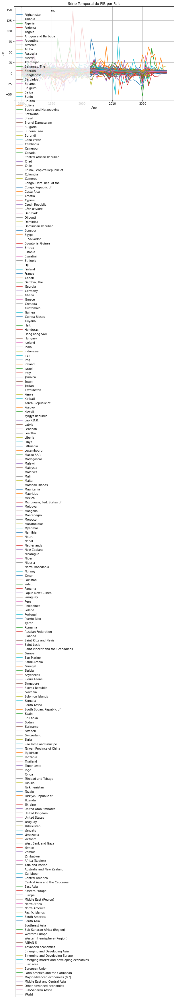

In [75]:
df_transposed.plot(kind='line', figsize=(10, 6))

plt.title('Série Temporal do PIB por País')
plt.xlabel('Ano')
plt.ylabel('PIB')
plt.grid(True)

plt.show()

O gráfico não ficou muito bom, porque são muitas séries temporais. Então, vamos dividir os países nos grupos econômicos e plotar por grupo. Para o plot foi utilizado o dataframe df_formatted, da pasta `data/02_intermediate`, que já está no formato adequado.

Os grupos são:

- Emerging and developing Asia

- Emerging and developing Europe

- Latin America and the Caribbean

- Middle east and central Asia

- Sub saharan Africa

- Major advanced economies (G7)

- Euro area

- Other advanced economies

In [76]:
emerging_and_developing_asia = ['Bangladesh', 'Bhutan', 'Brunei Darussalam', 'Cambodia', "China, People's Republic of", 'Fiji', 'India', 'Indonesia', 'Kiribati', 'Lao P.D.R.', 'Malaysia', 'Maldives', 'Marshall Islands', 'Micronesia, Fed. States of', 'Mongolia', 'Myanmar', 'Nauru', 'Nepal', 'Palau', 'Papua New Guinea', 'Philippines', 'Samoa', 'Solomon Islands', 'Sri Lanka', 'Thailand', 'Timor-Leste', 'Tonga', 'Tuvalu', 'Vanuatu', 'Vietnam']

emerging_and_developing_europe = ['Albania', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Hungary',  'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia ', 'Poland', 'Romania', 'Russian Federation',  'Serbia', 'Türkiye, Republic of', 'Ukraine']

latin_america_and_the_caribbean = ['Antigua and Barbuda', 'Argentina', 'Aruba', 'Bahamas, The', 'Barbados', 'Belize', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Costa Rica', 'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Grenada', 'Guatemala', 'Guyana', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Suriname', 'Trinidad and Tobago', 'Uruguay', 'Venezuela']

middle_east_and_central_asia = ['Afghanistan', 'Algeria', 'Armenia', 'Azerbaijan', 'Bahrain', 'Djibouti', 'Egypt', 'Georgia', 'Iran', 'Iraq', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyz Republic', 'Lebanon',  'Libya', 'Mauritania', 'Morocco', 'Oman', 'Pakistan', 'Qatar', 'Saudi Arabia', 'Somalia', 'Sudan', 'Syria', 'Tajikistan', 'Tunisia', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'West Bank and Gaza', 'Yemen']

sub_saharan_africa = ['Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', "Côte d'Ivoire", 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritius', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'South Africa', 'South Sudan, Republic of', 'Tanzania', 'Togo', 'Uganda', 'Zambia', 'Zimbabwe']

major_advanced_economies_g7 = ['Canada', 'France', 'Germany', 'Italy', 'Japan', 'United Kingdom', 'United States']

euro_area = ['Austria', 'Belgium', 'Croatia', 'Cyprus', 'Estonia', 'Finland', 'Greece', 'Ireland', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta','Netherlands', 'Portugal', 'Slovak Republic', 'Slovenia', 'Spain']

other_advanced_economies = ['Andorra', 'Australia', 'Czech Republic', 'Denmark', 'Hong Kong SAR', 'Iceland', 'Israel', 'Korea, Republic of', 'Macao SAR', 'New Zealand', 'Norway', 'Puerto Rico', 'San Marino', 'Singapore', 'Sweden', 'Switzerland', 'Taiwan Province of China']

In [77]:
df_formatted = pd.read_csv('../data/02_intermediate/formatted.csv')
df_formatted.head()

,pais,ano,pib
0,Afghanistan,1980,NaN
1,Afghanistan,1981,NaN
2,Afghanistan,1982,NaN
3,Afghanistan,1983,NaN
4,Afghanistan,1984,NaN


In [78]:
df_emerging_and_developing_asia = df_formatted.loc[df_formatted['pais'].isin(emerging_and_developing_asia)]
df_emerging_and_developing_europe = df_formatted.loc[df_formatted['pais'].isin(emerging_and_developing_europe)]
df_latin_america_and_the_caribbean = df_formatted.loc[df_formatted['pais'].isin(latin_america_and_the_caribbean)]
df_middle_east_and_central_asia = df_formatted.loc[df_formatted['pais'].isin(middle_east_and_central_asia)]
df_sub_saharan_africa = df_formatted.loc[df_formatted['pais'].isin(sub_saharan_africa)]
df_major_advanced_economies_g7 = df_formatted.loc[df_formatted['pais'].isin(major_advanced_economies_g7)]
df_euro_area = df_formatted.loc[df_formatted['pais'].isin(euro_area)]
df_other_advanced_economies = df_formatted.loc[df_formatted['pais'].isin(other_advanced_economies)]
lista_df = [df_emerging_and_developing_asia , df_emerging_and_developing_europe, df_latin_america_and_the_caribbean, df_middle_east_and_central_asia, df_sub_saharan_africa, df_major_advanced_economies_g7, df_euro_area, df_other_advanced_economies]

<Figure size 1440x576 with 0 Axes>

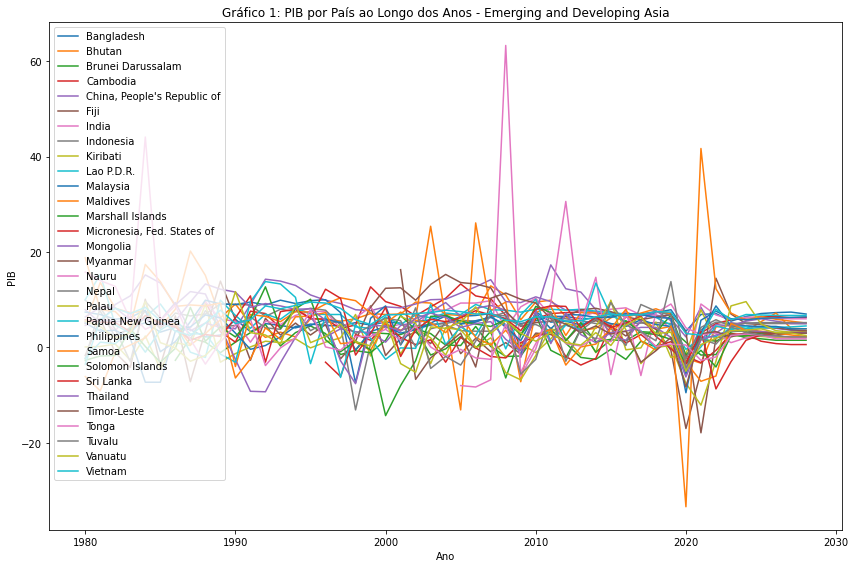

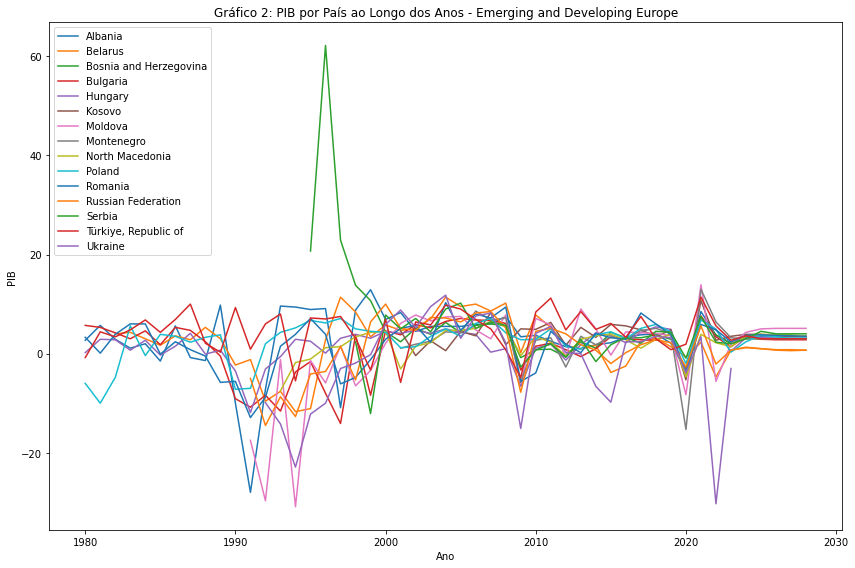

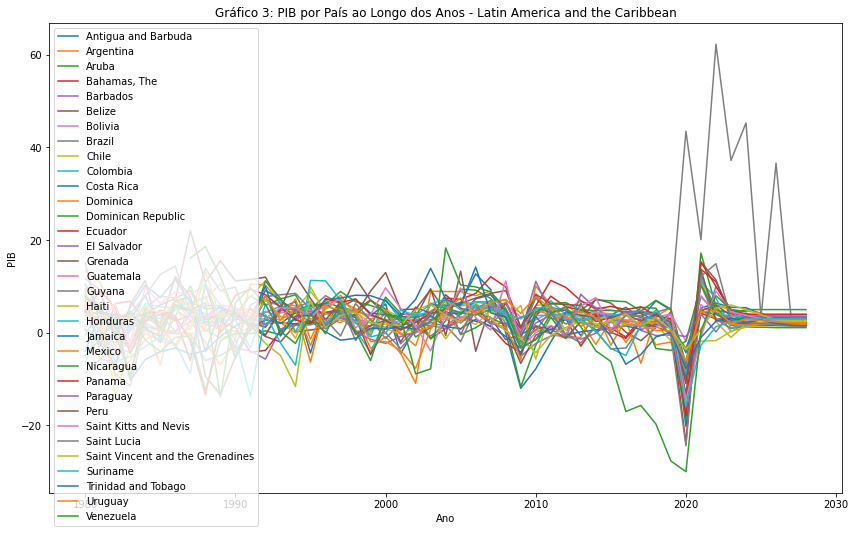

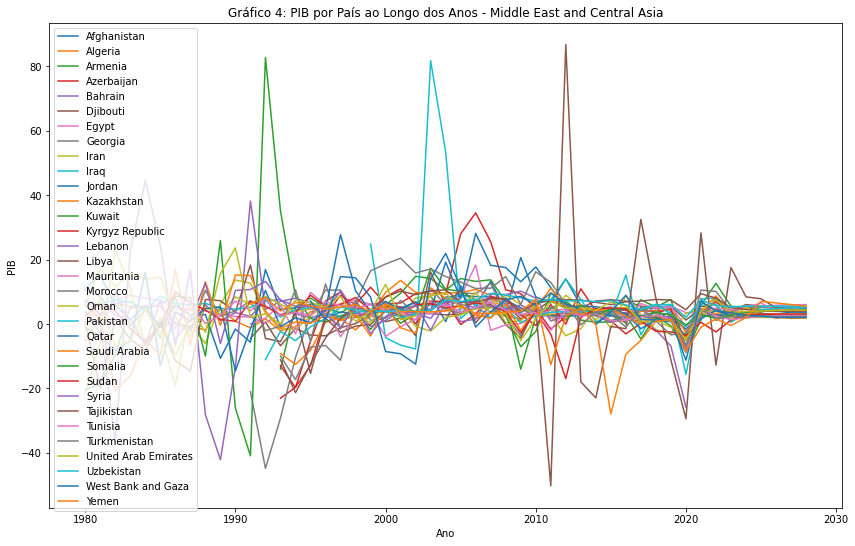

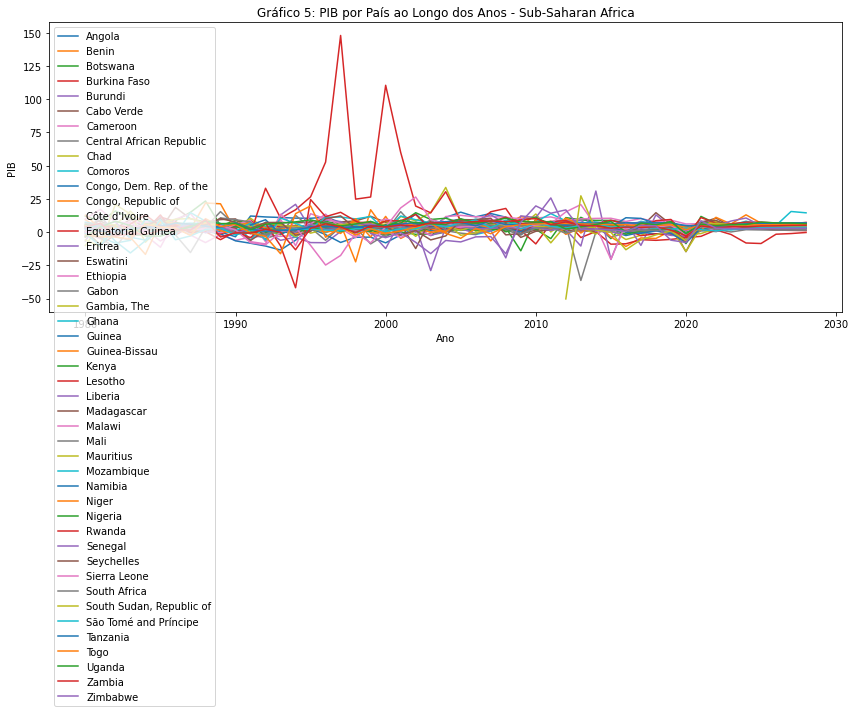

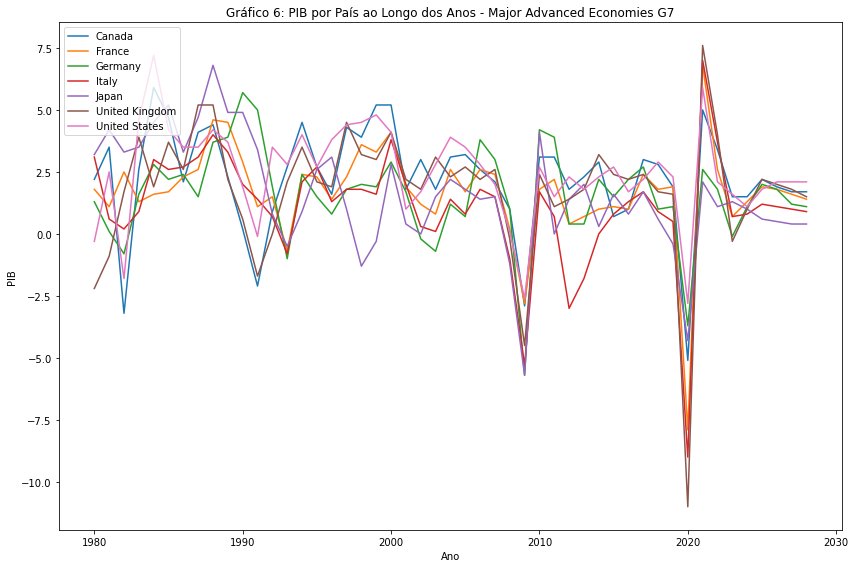

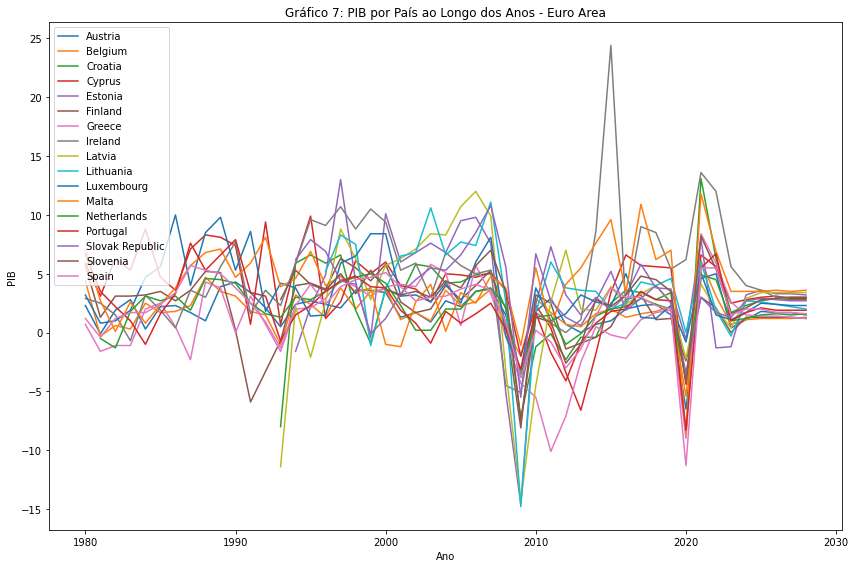

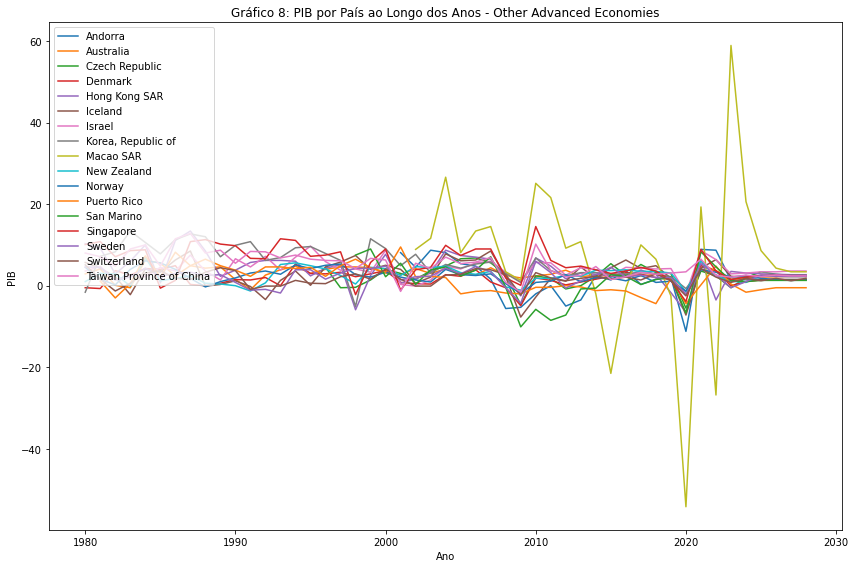

In [79]:
plt.figure(figsize=(20, 8))

regioes_economicas = ['Emerging and Developing Asia', 'Emerging and Developing Europe', 'Latin America and the Caribbean', 'Middle East and Central Asia', 'Sub-Saharan Africa', 'Major Advanced Economies G7', 'Euro Area', 'Other Advanced Economies']

for idx, df in enumerate(lista_df, start=1):
    plt.figure(figsize=(12, 8))
    pais_lista = df['pais'].unique()
    
    # Encontrar o nome da região econômica com base no índice do loop
    nome_regiao = regioes_economicas[idx - 1]
    
    for pais in pais_lista:
        df_pais = df[df['pais'] == pais]
        plt.plot(df_pais['ano'], df_pais['pib'], label=pais)
    
    plt.xlabel('Ano')
    plt.ylabel('PIB')
    plt.title(f'Gráfico {idx}: PIB por País ao Longo dos Anos - {nome_regiao}')
    plt.legend(loc='upper left')
    
    plt.tight_layout()

    plt.show()

In [80]:
print(f"Estatísticas descritivas gerais:")
print(df_formatted.describe())
print("-" * 32)
for idx, df in enumerate(lista_df, start=0):
    nome_regiao = regioes_economicas[idx]
    
    print(f"Estatísticas descritivas para {nome_regiao}")
    print(df.describe())
    print("-" * 32)

Estatísticas descritivas gerais:
               ano          pib
count  9604.000000  8781.000000
mean   2004.000000     3.347534
std      14.142872     6.064496
min    1980.000000   -54.200000
25%    1992.000000     1.400000
50%    2004.000000     3.400000
75%    2016.000000     5.700000
max    2028.000000   148.000000
--------------------------------
Estatísticas descritivas para Emerging and Developing Asia
               ano          pib
count  1470.000000  1314.000000
mean   2004.000000     4.255327
std      14.146948     5.103604
min    1980.000000   -33.400000
25%    1992.000000     2.000000
50%    2004.000000     4.500000
75%    2016.000000     6.800000
max    2028.000000    63.300000
--------------------------------
Estatísticas descritivas para Emerging and Developing Europe
               ano         pib
count   735.000000  606.000000
mean   2004.000000    2.356436
std      14.151766    6.131729
min    1980.000000  -30.900000
25%    1992.000000    0.825000
50%    2004.000000 

A análise de séries temporais é diferente da análise das demais séries. Normalmente, são utilizados gráficos de linha, testes de estacionariedade e correlação/autocorrelação dos períodos.

De forma geral, não identificamos padrões nas séries temporais por grupo econômico. Os países que apresentam maior similaridade de PIB estão nas regiões Major Advanced Economies G7 e Euro Area. Isso se justifica pois a quantidade de países é reduzida, mas eles experimentam cenários econômicos e de desenvolvimento parecidos, sofrendo de forma parecida com os eventos econômicos e monetários mundiais.

Obviamente, existem dados faltantes, que são a ausência da continuidade da linha , e outliers positivos e negativos, que são os picos nas linhas coloridas. Sobre esses, o método .describe() mostra numericamente os valores máximo e mínimo por região, com destaque para -54,2 na região Other Advanced Economies e 148 em Sub-Saharan Africa.

Entretanto, a aleatoriedade dos dados indicam que, provavelmente, as séries temporais são estacionárias, que é quando a média e a variância são constantes ao longo do tempo. Para outras séries, essa característica é conhecida como homocedasticidade. A estacionariedade é avaliada por testes estatísticos, que serão feitos mais adiante.

As séries não estacionárias, pelo contrário, apresentam tendências ou sazonalidades. As tendências representam comportamento continuado de crescimento ou decrescimento, como o aumento da temperatura mundial, enquanto as sazonalidades são comportamentos repetidos com determinada frequência, em determinados períodos, como a queda de vendas de passagens aéreas após o período de férias.

Considerando que os valores nulos são significativos para alguns anos, podendo perfazer até 27% do total, é necessário preencher esses dados de alguma forma.

### A imputação dos dados

Nessa etapa, foram estudadas e avaliadas duas formas de imputação dos dados:

- A média dos países componentes de cada região econômica, conforme listas definidas pelo site da coleta dos dados (https://www.imf.org/en/Publications/WEO/weo-database/2023/April/select-aggr-data), já definidas anteriormente neste notebook.

- O uso do algoritmo KNN para imputação conforme os vizinhos.

A decisão foi pela imputação com o KNNImputer porque, após a modelagem e a metrificação dos resultados, esta imputação teve melhor desempenho, o que pode ser explicado, por um lado, pelo processamento desse algoritmo, e por outro, pelo contexto dos grupos econômicos.

O KNNImputer funciona com a identificação dos vizinhos mais próximos do valor nulo. No projeto, determinamos a identificação dos 3 vizinhos mais próximos no parâmetro `n_neighbors`, do arquivo `conf/base/parameters.yml`. Depois, calcula a média ou a mediana para estimar o valor faltante. Outro parâmetro usado foi o `weights`, que é o peso atribuído aos vizinhos mais próximos. No nosso caso, escolhemos `distance` para que os vizinhos mais próximos tivessem maior peso.

Já os grupos econômicos agregam países que não necessariamente experimentam o mesmo contexto, de modo que a média entre eles não é representativa da realidade. Por ser uma medida de tendência central sensível à variação dos demais valores que compõem os grupos, pode ser que não substitua da forma ideal os valores faltantes.

Como o método do KNNImputer foi usado no código, apresentamos aqui o código usado para a imputação pela média dos grupos econômicos:

In [81]:
# Verifica a correção do tamanho das listas
developing_economies = emerging_and_developing_asia + emerging_and_developing_europe + latin_america_and_the_caribbean + middle_east_and_central_asia + sub_saharan_africa
advanced_economies = major_advanced_economies_g7 + euro_area + other_advanced_economies
print(len(developing_economies))
print(len(advanced_economies))
print(len(developing_economies + advanced_economies))

155
41
196


In [82]:
# Cria dataframes para cada grupo com as séries de cada país
df_emerging_and_developing_asia = df_eda.loc[df_eda['ano'].isin(emerging_and_developing_asia)]
df_emerging_and_developing_europe = df_eda.loc[df_eda['ano'].isin(emerging_and_developing_europe)]
df_latin_america_and_the_caribbean = df_eda.loc[df_eda['ano'].isin(latin_america_and_the_caribbean)]
df_middle_east_and_central_asia = df_eda.loc[df_eda['ano'].isin(middle_east_and_central_asia)]
df_sub_saharan_africa = df_eda.loc[df_eda['ano'].isin(sub_saharan_africa)]
df_major_advanced_economies_g7 = df_eda.loc[df_eda['ano'].isin(major_advanced_economies_g7)]
df_euro_area = df_eda.loc[df_eda['ano'].isin(euro_area)]
df_other_advanced_economies = df_eda.loc[df_eda['ano'].isin(other_advanced_economies)]

In [83]:
# Verifica a porcentagem de nulos por grupo
# No geral, as porcentagens são pulverizadas
porcentagem_nulos_df_developing_asia = (df_emerging_and_developing_asia.isna().sum()/len(df))*100
porcentagem_nulos_df_developing_europe = (df_emerging_and_developing_europe.isna().sum()/len(df))*100
porcentagem_nulos_df_latin_america = (df_latin_america_and_the_caribbean.isna().sum()/len(df))*100
porcentagem_nulos_df_central_asia = (df_middle_east_and_central_asia.isna().sum()/len(df))*100
porcentagem_nulos_df_sub_saharan_africa = (df_sub_saharan_africa.isna().sum()/len(df))*100
porcentagem_nulos_df_g7 = (df_major_advanced_economies_g7.isna().sum()/len(df))*100
porcentagem_nulos_df_euro_area = (df_euro_area.isna().sum()/len(df))*100
porcentagem_nulos_df_other_advanced = (df_other_advanced_economies.isna().sum()/len(df))*100
df_porcentagens = pd.DataFrame({'Ano': porcentagem_nulos_df_developing_asia.index, 
                                'developing asia': porcentagem_nulos_df_developing_asia.values,
                                'developing europe': porcentagem_nulos_df_developing_europe.values,
                                'latin america': porcentagem_nulos_df_latin_america.values,
                                'central asia': porcentagem_nulos_df_central_asia.values,
                                'sub saharan africa': porcentagem_nulos_df_sub_saharan_africa.values,
                                'g7': porcentagem_nulos_df_g7.values,
                                'euro area': porcentagem_nulos_df_euro_area.values,
                                'other advanced': porcentagem_nulos_df_other_advanced.values})
display(df_porcentagens)

,Ano,developing asia,developing europe,latin america,central asia,sub saharan africa,g7,euro area,other advanced
0,ano,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,1980,1.200480,1.080432,0.120048,1.800720,0.840336,0.0,0.840336,0.600240
2,1981,1.080432,1.080432,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
3,1982,1.080432,0.960384,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
4,1983,1.080432,0.960384,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
5,1984,1.080432,0.960384,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
6,1985,1.080432,0.960384,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
7,1986,0.960384,0.960384,0.120048,1.800720,0.720288,0.0,0.720288,0.480192
8,1987,0.960384,0.960384,0.000000,1.800720,0.720288,0.0,0.720288,0.480192
9,1988,0.840336,0.960384,0.000000,1.800720,0.720288,0.0,0.720288,0.480192


In [84]:
# Imputa os valores nulos com a média do grupo
df_emerging_and_developing_asia = df_emerging_and_developing_asia.fillna(df_emerging_and_developing_asia.mean())
df_emerging_and_developing_europe = df_emerging_and_developing_europe.fillna(df_emerging_and_developing_europe.mean())
df_latin_america_and_the_caribbean = df_latin_america_and_the_caribbean.fillna(df_latin_america_and_the_caribbean.mean())
df_middle_east_and_central_asia = df_middle_east_and_central_asia.fillna(df_middle_east_and_central_asia.mean())
df_sub_saharan_africa = df_sub_saharan_africa.fillna(df_sub_saharan_africa.mean())
df_major_advanced_economies_g7 = df_major_advanced_economies_g7.fillna(df_major_advanced_economies_g7.mean())
df_euro_area = df_euro_area.fillna(df_euro_area.mean())
df_other_advanced_economies = df_other_advanced_economies.fillna(df_other_advanced_economies.mean())

C:\Users\carlo\AppData\Local\Temp\ipykernel_15716\3635002232.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_emerging_and_developing_asia = df_emerging_and_developing_asia.fillna(df_emerging_and_developing_asia.mean())
C:\Users\carlo\AppData\Local\Temp\ipykernel_15716\3635002232.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_emerging_and_developing_europe = df_emerging_and_developing_europe.fillna(df_emerging_and_developing_europe.mean())
C:\Users\carlo\AppData\Local\Temp\ipykernel_15716\3635002232.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

In [88]:
# Une os dataframes das regiões, organizado em ordem alfabética
df_imputado = pd.concat([df_emerging_and_developing_asia ,
                        df_emerging_and_developing_europe,
                        df_latin_america_and_the_caribbean,
                        df_middle_east_and_central_asia,
                        df_sub_saharan_africa,
                        df_major_advanced_economies_g7,
                        df_euro_area,
                        df_other_advanced_economies])
df_imputado= df_imputado.sort_values(by=['ano'])
df_imputado

,ano,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,0.988235,1.511765,0.182353,3.376471,5.247059,2.947059,0.788235,1.670588,1.682353,...,3.9,-2.4,5.224138,4.2,3.444828,3.737931,3.837931,3.555172,3.641379,3.596552
1,Albania,2.700000,5.700000,2.900000,1.100000,2.000000,-1.500000,5.600000,-0.800000,-1.400000,...,2.1,-3.5,8.500000,3.7,2.200000,3.300000,3.400000,3.400000,3.400000,3.400000
2,Algeria,-5.400000,3.000000,6.400000,5.400000,5.600000,5.600000,-0.200000,-0.700000,-1.900000,...,1.0,-5.1,3.400000,2.9,2.600000,2.600000,2.200000,2.100000,1.700000,1.800000
3,Andorra,4.475000,4.500000,2.361538,3.584615,6.453846,3.453846,5.476923,6.523077,4.630769,...,2.0,-11.2,8.900000,8.7,1.300000,1.500000,1.500000,1.500000,1.500000,1.500000
4,Angola,2.400000,-4.400000,0.000000,4.200000,6.000000,3.500000,2.900000,4.100000,6.100000,...,-0.7,-5.6,1.100000,2.8,3.500000,3.700000,4.000000,4.100000,4.200000,4.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,-3.500000,5.800000,8.200000,7.100000,8.400000,5.600000,3.400000,2.500000,5.100000,...,7.4,2.9,2.600000,8.0,5.800000,6.900000,6.800000,6.700000,6.700000,6.700000
192,West Bank and Gaza,0.988235,1.511765,0.182353,3.376471,5.247059,2.947059,0.788235,1.670588,1.682353,...,1.4,-11.3,7.000000,4.0,3.500000,2.700000,2.400000,2.000000,2.000000,2.000000
193,Yemen,0.988235,1.511765,0.182353,3.376471,5.247059,2.947059,0.788235,1.670588,1.682353,...,1.4,-8.5,-1.000000,1.5,-0.500000,2.000000,7.000000,6.500000,6.000000,5.500000
194,Zambia,3.900000,6.600000,-2.900000,-1.100000,-1.700000,1.200000,1.700000,1.500000,9.300000,...,1.4,-2.8,4.600000,3.4,4.000000,4.100000,4.600000,4.700000,5.000000,5.100000


### EDA após a imputação dos dados

Agora, vamos nos dedicar a exploração dos dados após a imputação, pois com o preenchimento dos valores nulos, será possível rodar todos os testes. Usaremos o dataframe `filled` da pasta `data/02_intermediate`, que está formatado e preenchido com o KNNImputer.

Em primeiro lugar, vamos chegar a estacionariedade por série temporal usando o teste ADF (Augmented Dickey-Fuller), usado a partir do cálculo do p-valor comparado ao nível de significância (de 5%), em que a hipótese nula (H0) é de não estacionariedade. Assim, se o p-valor for menor que 0,05, conclui-se que a série é estacionária. 

In [93]:
df_filled = pd.read_csv('../data/02_intermediate/filled.csv')
df_filled.head()

,pais,ano,pib
0,Afghanistan,1980,3.347534
1,Afghanistan,1981,3.347534
2,Afghanistan,1982,3.347534
3,Afghanistan,1983,3.347534
4,Afghanistan,1984,3.347534


In [94]:
# Lista de valores únicos de países, listas para armazenar os países estacionários e não estacionários e definição da significância
paises = df_filled['pais'].unique()
estacionarios = []
nao_estacionarios = []
significancia = 0.05

# Itera sobre a lista e aplica o teste
for pais in paises:
    data_for_pais = df_filled[df_filled['pais'] == pais]['pib']
    teste_fuller_estac = adfuller(data_for_pais)
    if teste_fuller_estac[1] <= significancia: 
        estacionarios.append(pais)
    else:
       nao_estacionarios.append(pais)

print(f"{len(estacionarios)} países estacionários: {estacionarios}")
print(f"{len(nao_estacionarios)} países não estacionários: {nao_estacionarios}")

167 países estacionários: ['Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'Colombia', 'Comoros', 'Congo, Republic of ', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', "Côte d'Ivoire", 'Denmark', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Eritrea', 'Estonia', 'Eswatini', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia, The', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Hong Kong SAR', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Kosovo', 'Kuwait', 'Kyrgyz Republic', '

Como assumimos anteriormente, a maioria dos países apresenta série temporal estacionária. Vamos plotar os gráficos de linha dos países não estacionários, que seriam exceções.

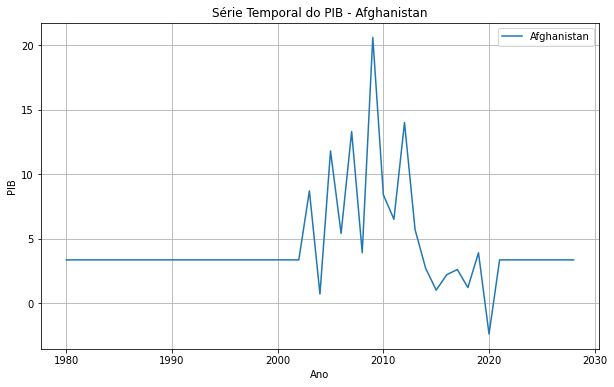

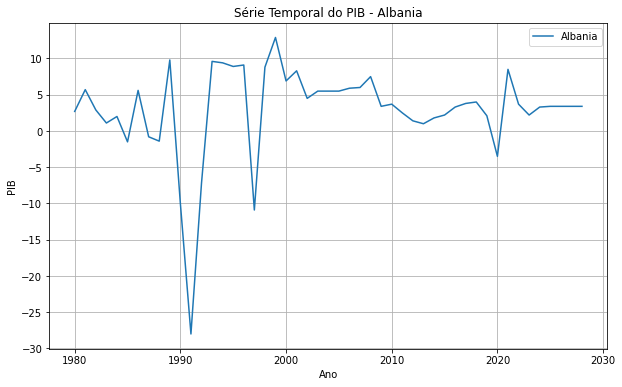

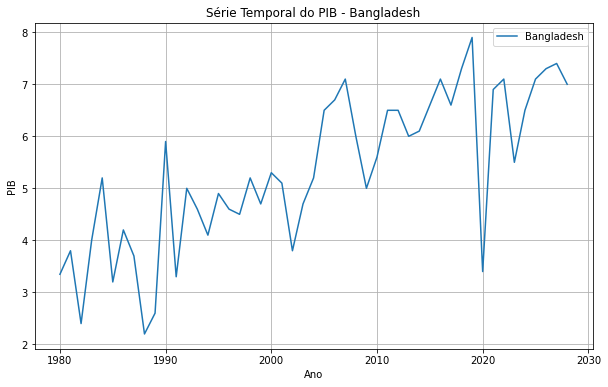

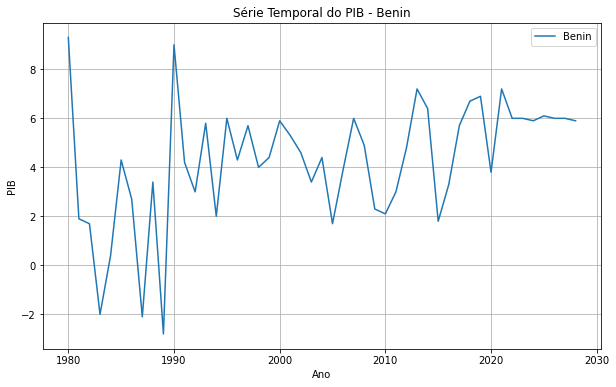

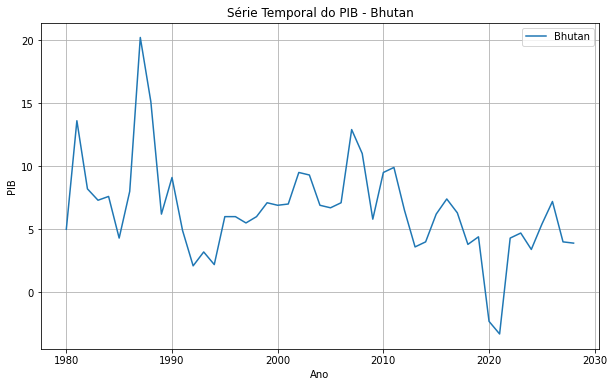

...

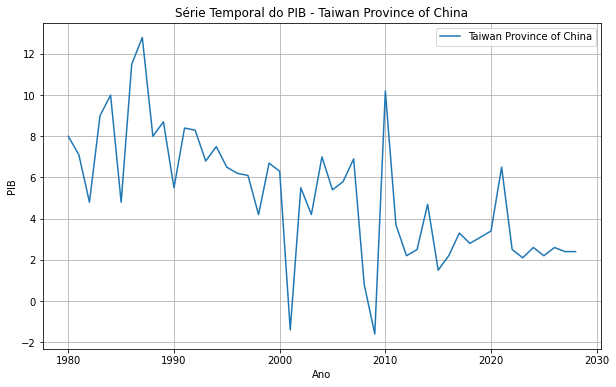

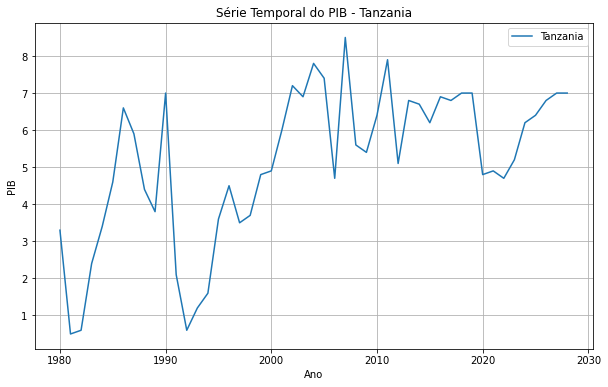

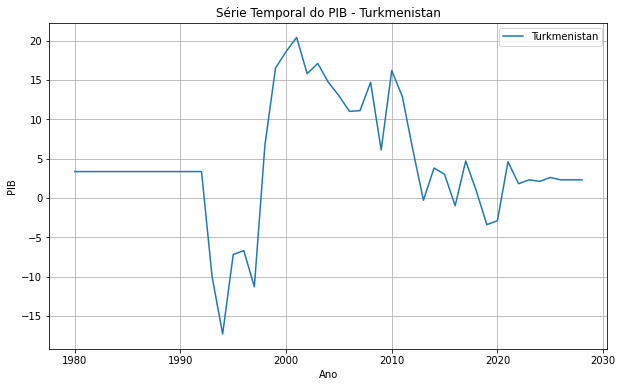

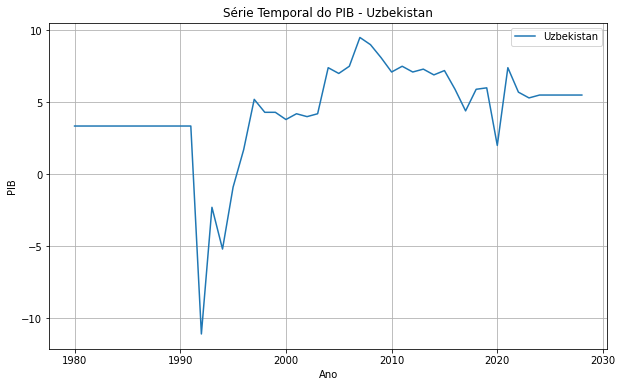

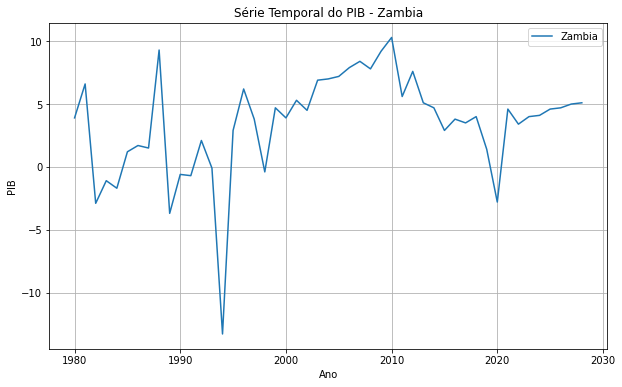

In [95]:
for pais in nao_estacionarios:
    data_for_pais = df_filled[df_filled['pais'] == pais]
    plt.figure(figsize=(10, 6))
    plt.plot(data_for_pais['ano'], data_for_pais['pib'], label=pais)
    plt.xlabel('Ano')
    plt.ylabel('PIB')
    plt.title(f'Série Temporal do PIB - {pais}')
    plt.legend()
    plt.grid()
    plt.show()

De fato, países como Bangladesh e Mozambique apresentam tendência de aumento, enquanto Bhutan e Puerto Rico, de queda.

Em seguida, é importante verificar a autocorrelação (ACF) e a correlação(PACF) entre os períodos. A autocorrelação calcula a dependência de determinada observação para com as observações passadas, seja ela direta (do tempo `t-1` para o tempo `t`) ou indireta (do tempo `t-2` para o tempo `t-1`, que influencia o tempo `t`). Já a correlação mede somente a influência direta, ou seja, dos tempos `t-1`, `t-2`, `t-3`... no tempo `t`.


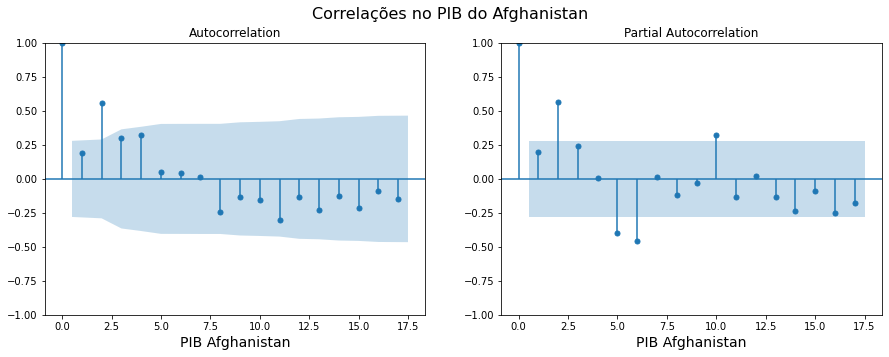

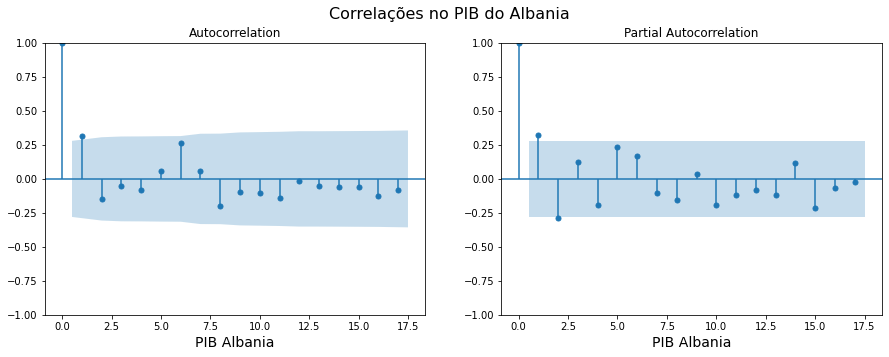

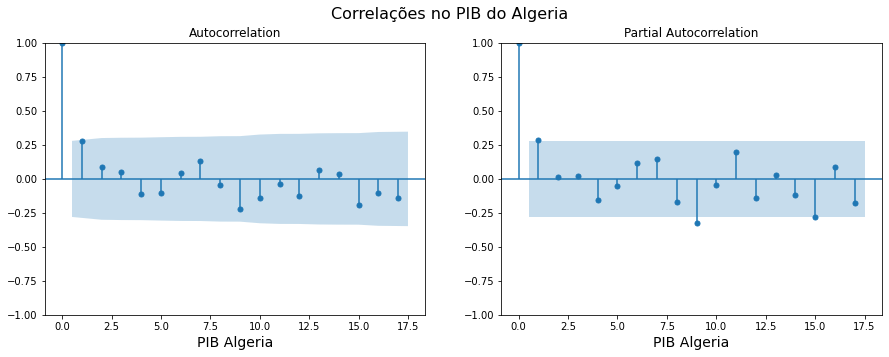

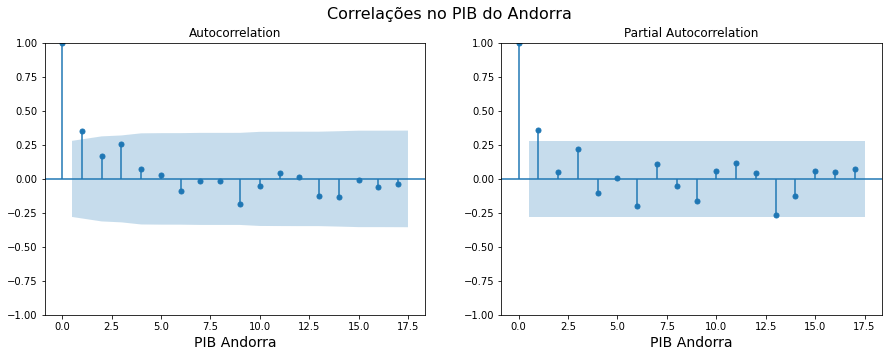

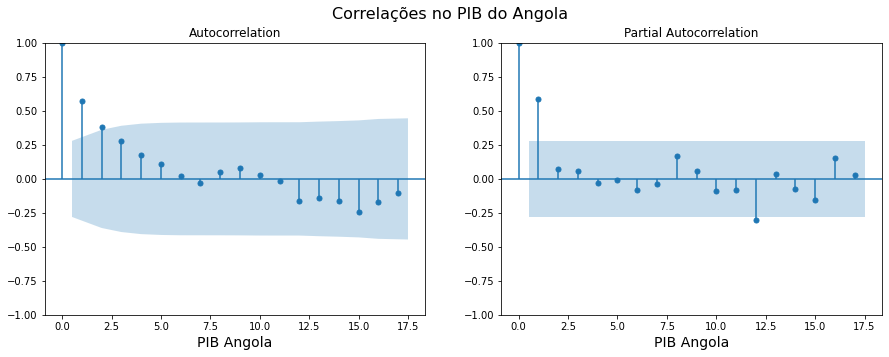

...

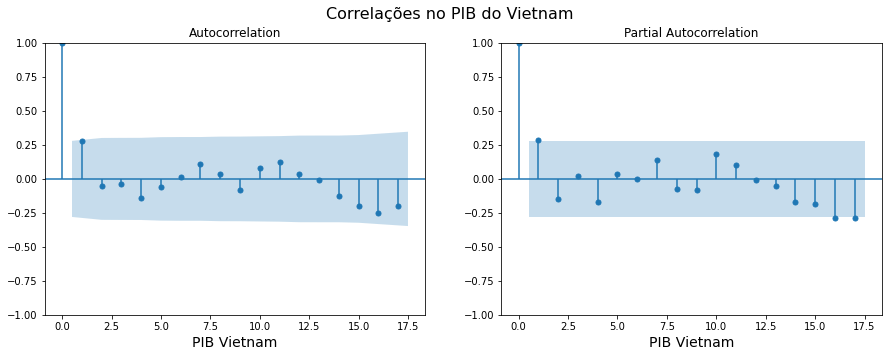

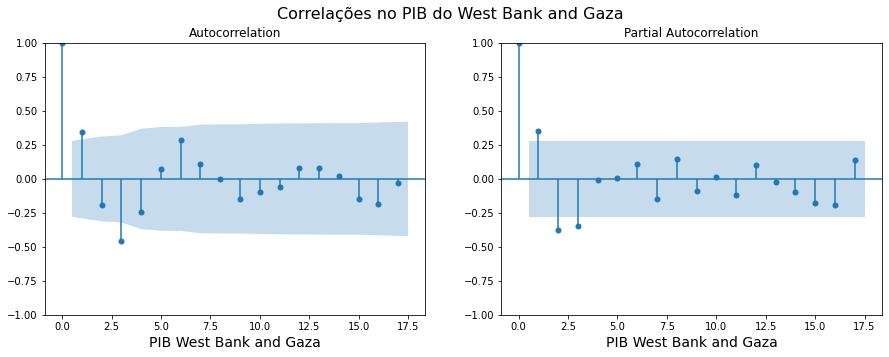

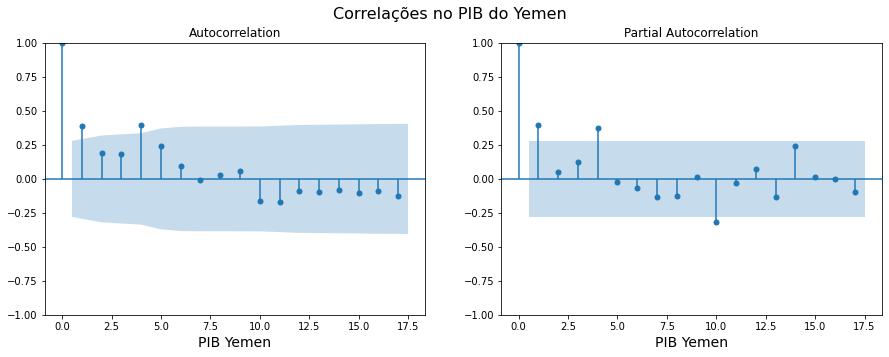

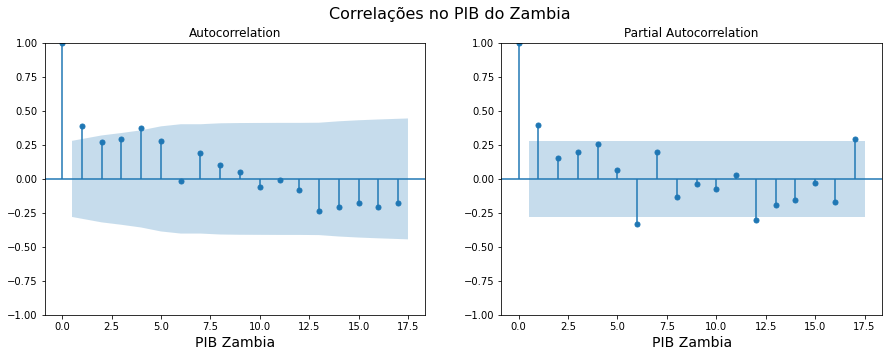

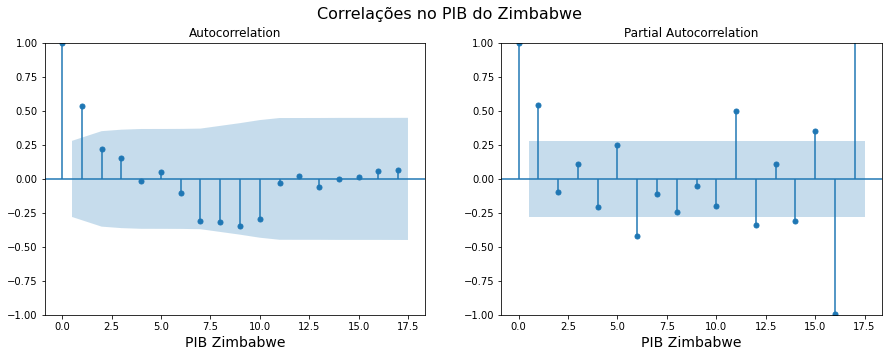

In [98]:
for pais in paises:
    df_pais = df_filled[df_filled['pais'] == pais]

    # ACF
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    plot_acf(df_pais['pib'],ax=ax[0], zero=True) 
    ax[0].set_xlabel(f'PIB {pais}',size=14)

    #PACF
    plot_pacf(df_pais['pib'],ax=ax[1],zero=True)
    ax[1].set_xlabel(f'PIB {pais}',size=14)
    plt.suptitle(f"Correlações no PIB do {pais}",size=16)

    plt.show()

A autocorrelação e correlação indicam quantos períodos temos que voltar para a prever os dados futuros. Pelos gráficos plotados, a primeira estaca se refere ao próprio período, e não deve ser considerada. Caso as estacas estejam fora da área azul claro, deve ser considerado o período anterior para a previsão futura. Caso não, os dados anteriores não influenciam nos dados posteriores.

Verificamos que a maioria dos países não apresenta correlação, pois o período imediatamente anterior não influencia de forma significativa no dado posterior. Exceções: Angola, Belarus, China, Egypt, Georgia, Korea, Mongolia, Morocco, Russia, San Marino, Tanzania, Venezuela e Zimbabwe

### Modelo e métricas

Para a modelagem, selecionamos o modelo ARIMA, pois é uma junção de outros três modelos básicos para previsão de séries temporais: Autoregressão (AR), Integração (I) e Média Móvel (MA). Em razão do parâmetro d, esse modelo pode ser aplicado para séries estacionárias ou não estacionárias. 

No treinamento do modelo, podemos determinar 3 parâmetros:

- p: número de valores anteriores considerados (AR). Definimos como 1 porque nos gráficos de ACF e PACF, examinamos que, no máximo, deveria ser considerado o período imediatamente anterior.

- d: diferenciação para tornar a série estacionária (I). Definimos como 0 para as séries estacionárias, pois não houve diferenciação, e 1 para as não estacionárias.

- q: número de erros anteriores considerados (MA). Definimos como 1 também para considerar 1 erro médio na previsão.

Vamos iniciar a modelagem dos dados, com o mesmo código dos pipelines de training e inferencing:

In [109]:
df_w_index = df_filled.copy()

In [110]:
# Define o ano como índice do dataframe e altera o tipo da coluna para datetime
df_w_index.set_index("ano", inplace=True)
df_w_index.index = pd.to_datetime(df_w_index.index, format="%Y").to_period("A")
df_w_index

,pais,pib
ano,,
1980,Afghanistan,3.347534
1981,Afghanistan,3.347534
1982,Afghanistan,3.347534
1983,Afghanistan,3.347534
1984,Afghanistan,3.347534
...,...,...
2024,Zimbabwe,2.600000
2025,Zimbabwe,2.700000
2026,Zimbabwe,2.800000


In [111]:
type(df_w_index.index)

pandas.core.indexes.period.PeriodIndex

In [112]:
# Cria um dicionário para receber os dataframes
dataframes_por_pais = {}

# Agrupa o dataframe preenchido por país
grupo_paises = df_w_index.groupby('pais')

# Itera sobre os grupos dos países, seleciona as colunas que serão mantidas, cria um dataframe para cada país e armazena em um dicionário chamado 'dataframes_por_pais'
for pais, grupo in grupo_paises:
    df_pais = grupo.copy()
    dataframes_por_pais[pais] = df_pais

In [113]:
# Cria os dicionários para armazenar os dataframes de treino e de teste
dataframes_treino = {}
dataframes_teste = {}

# Itera sobre o dicionário da função anterior e separa os dataframes para treino e teste, sendo de treino dos anos 1980 a 2023 e teste de 2024 a 2028
for nome, df_parte in dataframes_por_pais.items():
    df_treino = df_parte[df_parte.index <= pd.Period('2023', freq='A')].copy()
    df_teste = df_parte[df_parte.index > pd.Period('2023', freq='A')].copy()
    dataframes_treino[nome] = df_treino
    dataframes_teste[nome] = df_teste

In [114]:
# Cria um dicionário para armazenar os modelos para cada dataframe
modelos_arima = {}

# Itera sobre os países que estão na lista dos estacionários e treina o modelo ARIMA para cada dataframe
for pais in estacionarios:
    df_treino = dataframes_treino[pais]
    modelo = ARIMA(endog=df_treino['pib'], order=(1, 0, 1)).fit()
    modelos_arima[pais] = modelo

# Itera sobre os países que estão na lista dos não estacionários e treina o modelo ARIMA para cada dataframe
for pais in nao_estacionarios:
    df_treino = dataframes_treino[pais]
    modelo = ARIMA(endog=df_treino['pib'], order=(1, 1, 1)).fit()
    modelos_arima[pais] = modelo

c:\Users\carlo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\carlo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\carlo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\carlo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using

In [115]:
dataframes_dados_teste = dataframes_teste.copy()

# Itera sobre o dicionário com os modelos para os dataframes de teste e fas as previsões para esse dataframe
for pais, modelo in modelos_arima.items():
    df_teste = dataframes_dados_teste[pais]
    previsoes_teste = modelo.predict(start=df_teste.index.min(), end=df_teste.index.max())
    df_teste['prev_arima'] = previsoes_teste

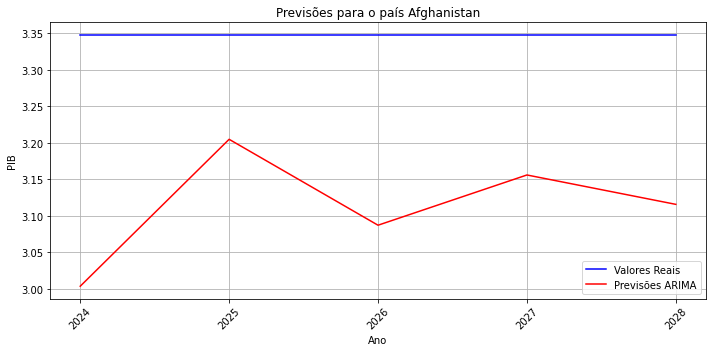

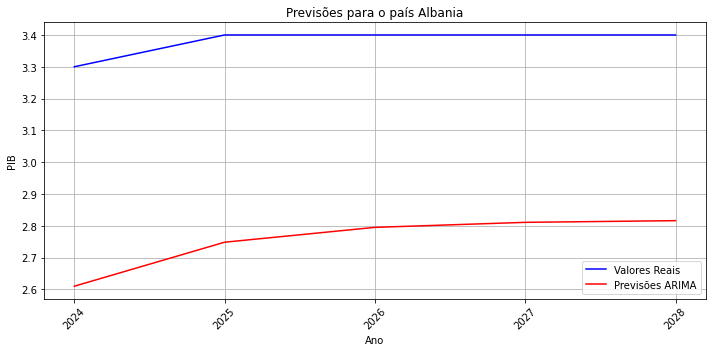

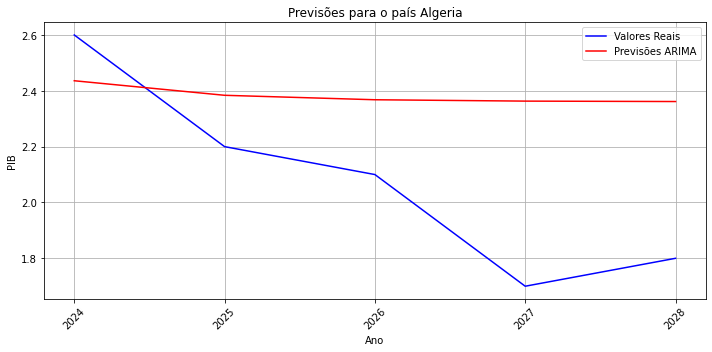

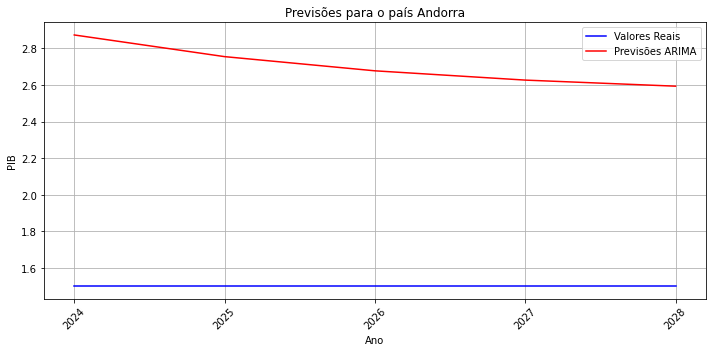

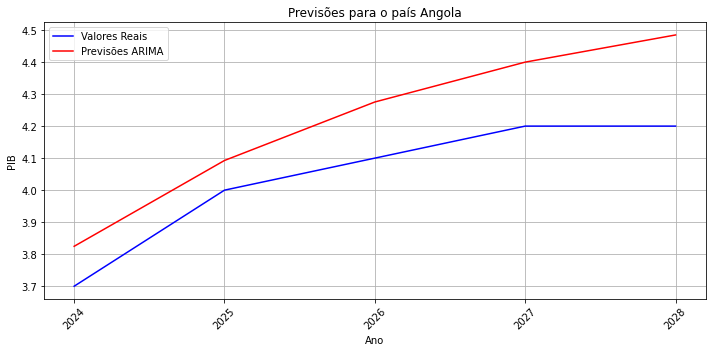

...

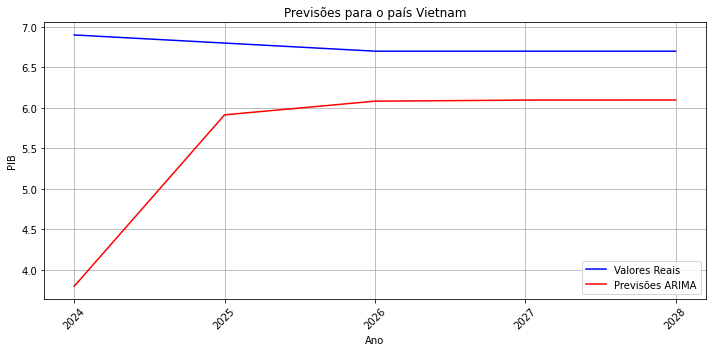

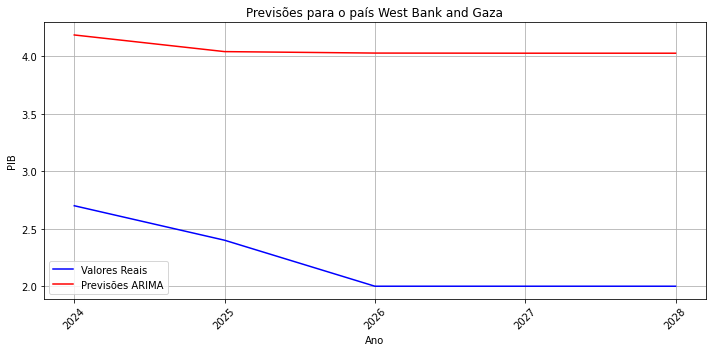

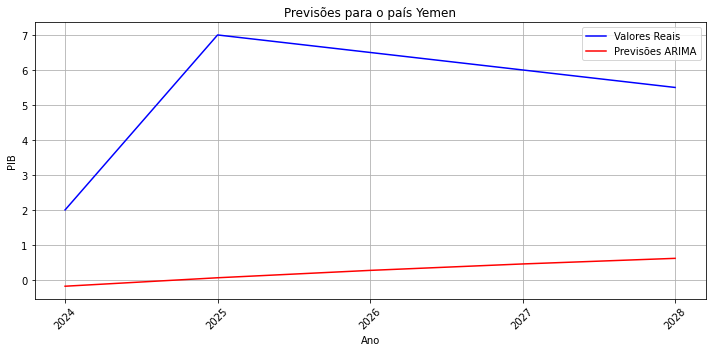

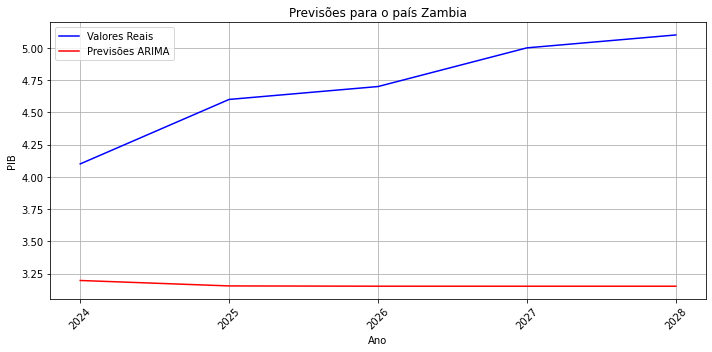

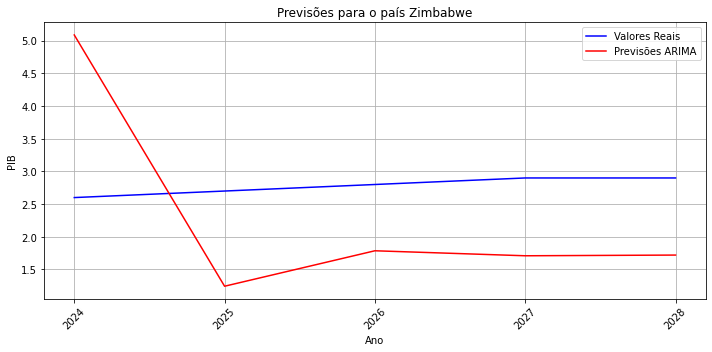

In [117]:
# Cria lista dos países em ordem alfabética
paises_ordem_alfabetica = sorted(estacionarios + nao_estacionarios)

# Itera sobre essa lista e cria um df para cada país
for pais in paises_ordem_alfabetica:
    df_teste = dataframes_teste[pais]
    
    plt.figure(figsize=(10, 5))
    
    # Plota os valores reais
    plt.plot(df_teste.index.astype(str), df_teste['pib'], label='Valores Reais', color='blue')
    
    # Plota as previsões
    plt.plot(df_teste.index.astype(str), df_teste['prev_arima'], label='Previsões ARIMA', color='red')
    
    plt.title(f"Previsões para o país {pais}")
    plt.xlabel('Ano')
    plt.ylabel('PIB')
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Nos gráficos de linha, observamos a linha azul com os valores reais e a linha vermelha com as previsões do modelo treinado. Para algumas séries, o modelo performa melhor do que para outras. Agora vamos quantificar essa performance:

In [121]:
# Cria listas para armazenar as métricas
rmse_list = []
mae_list = []
mape_list = []

# Itera sobre a lista dos países em ordem alfabética, calcula as métricas e adiciona na linha
for pais in paises_ordem_alfabetica:
    df_teste = dataframes_teste[pais]

    rmse = np.sqrt(mean_squared_error(df_teste['pib'], df_teste['prev_arima']))
    mae = mean_absolute_error(df_teste['pib'], df_teste['prev_arima'])
    mape = np.mean(np.abs((df_teste['pib'] - df_teste['prev_arima']) / df_teste['pib'])) * 100
    
    rmse_list.append(rmse)
    mae_list.append(mae)
    mape_list.append(mape)

# Cria o dataframe com as métricas
metrics_df = pd.DataFrame({
    'País': paises_ordem_alfabetica,
    'RMSE': rmse_list,
    'MAE': mae_list,
    'MAPE': mape_list
})

# Mostra todas as linhas do dataframe
pd.set_option('display.max_rows', None)
display(metrics_df)
pd.reset_option('display.max_rows')

,País,RMSE,MAE,MAPE
0,Afghanistan,0.243555,0.233980,6.989620
1,Albania,0.625329,0.623998,18.475899
2,Algeria,0.421305,0.368090,19.525293
3,Andorra,1.209860,1.205701,80.380065
4,Angola,0.187504,0.175412,4.299141
5,Antigua and Barbuda,0.904204,0.852237,24.271829
6,Argentina,0.242178,0.224769,11.238456
7,Armenia,0.296066,0.293516,6.358271
8,Aruba,2.499967,2.499451,219.836811
9,Australia,1.087494,0.982731,49.347876


In [125]:
metrics_df.to_csv('métricas.csv', decimal=',', sep=';')

As métricas escolhidas foram:

- RMSE: é a diferença média entre os valores previstos e os valores reais; penaliza erros maiores.

- MAE: é a média das diferenças absolutas entre as previsões e os valores reais; não é tão sensível a outliers.

- MAPE: é a média das porcentagens absolutas das diferenças entre as previsões e os valores reais; problemático para diferenças muito próximas de 0.

Todas elas seguem a lógica de quanto menor, melhor.

Confirmando os gráficos de linha, deduzimos que, para algumas séries temporais, o modelo performa muito bem, como para India, Korea, Seychelles, Syria e Uzbekistan . Já para outras, como Aruba, Guyana, Macao, Puerto Rico e Sri Lanka, o modelo erra muito nas previsões.

Assim, o uso de um único modelo, sem otimização, para 196 séries temporais talvez não seja o ideal, ao que seguem os pontos em que podemos melhorar este projeto:

### Oportunidades de melhoria:

Como pontos que podem ser aperfeiçoados, identificamos os seguintes:

- Criação de novas features, como, por exemplo: 

    a) a diferença entre o ano anterior e o ano atual de cada linha; 

    b) o valor da linha anterior; 

    c) o valor da linha posterior; 

    d) a média móvel; 

    e) inserção de variáveis exógenas da mesma base de dados do dataset original.

- Uso de outra estratégia de imputação dos dados nulos, como a sugerida nesse notebook ou até mesmo um modelo estatístico.

- Tratamento e verificação de valores máximos/mínimos e outliers, que aqui não foi feito em razão da baixa quantidade de observações para cada série temporal (dos anos 1980 a 2023, ou seja, 44 anos) e da utilização de uma única feature (PIB).

- Aplicar testes em cada pipeline para assegurar que os dados de entrada tenham o formato adequado para o código.

- Dividir os dados em validação, como forma de avaliar melhor e garantir a performance do modelo.

- Para o modelo ARIMA, testar novas combinações de parâmetros ou usar o autoARIMA, que seleciona a melhor combinação.

- Aplicar 1 modelo para cada série temporal, de forma personalizada, utilizando bibliotecas como scalecats e statsforecast.

- Usar o mlflow como ferramenta de gerenciamento do ciclo de vida do modelo.

- Servir o modelo em endpoint, como pelo FAST API.